This notebook performs gene set enrichment analysis of an EcoTyper results dataset, using `eco_helper enrich`.

## Input Section

This section defines the basic setup of the analysis. The subsequent cells can be run in bulk and need not necessarily be altered in any way.

### Variables to set
- config (optional)
  - The path to the Ecotyper config yaml file used for the experiments to summarize (if the same was used). The project folder can be specified as `{parent}`, the scripts folder within the parent can be specified as `{scripts}` if the config is not within either of these, and absolute path is required.
- directory
  - The name of the Ecotyper results directory. This needs to be either an absolute path or a subdirectory of the results directory within the project directory (parent directory). The results directory can be specified using `{results}`. 
- outdir 
  - The directory to save the outputs in.
- directory_is_absolute
  - Set this to *True* to mark the provided directory not as a subdirectory of the results directory but rather as a raw source directory containing eco_helper enrich results files.
- perform_enrichment (optional)
  - If no pathway enrichment has been performed yet, `eco_helper enrich` is called automatically irrespective of this variable. However, if enrichment has already been performed and data is found, this will force re-computation of the enrichment.

In [2]:
config = None
directory = "{results}/drop_hepato_run1_50"
outdir = "{parent}/gsea_results/drop_hepato_run1_50"

directory_is_absolute = False
perform_enrichment = False

The below variables are only required in case `eco_helper enrich` is called.

### Variables to set

- gene_sets
  - The gene sets to query.
- perform_enrichr
  - Set to False if `gseapy enrichr` should not be performed. This will also enable or disable loading of existing results.
- perform_prerank
  - Set to False if `prerank` should not be performed. This will also enable or disable loading of existing results.
- only_ecotype_contributing
  - Set to True to only perform gene set enrichment on celltypes and states that contribute to assigned Ecotypes.

In [3]:
gene_sets = [   "Reactome_2016", 
                "WikiPathway_2021_Human", 
                "Panther_2016", 
                "KEGG_2021_Human",
                "GO_Biological_Process_2021", 
                "GO_Molecular_Function_2021", 
                "GO_Cellular_Component_2021"  ]

perform_enrichr = True
perform_prerank = False
only_ecotype_contributing = True

---
<br>

> No need to alter anything in this section...

Now import necessary packages (and some others that may be handy for subsequent manual analysis so the user does not have to install them later)

In [4]:
import eco_helper as eh
import eco_helper.enrich as enrich
from eco_helper.enrich import visualise
from qpcr._auxiliary.graphical import make_layout_from_list

import os, glob
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.express as px
import plotly.graph_objs as go

Other project directories (need not necessarily be edited)

In [5]:
if not directory:
    raise ValueError("Please specify a directory.")

# the parent directory of the EcoTyper project
parent = "/data/users/noahkleinschmidt/EcoTyper"

# script and results directories within the parent
scripts = f"{parent}/scripts"
results = f"{parent}/results"
enrichments_dir = f"{parent}/gsea_enrichment"

outdir = outdir.format( parent = parent )
directory = directory.format( parent = parent, results = results )
data_dir = f"{enrichments_dir}/{ os.path.basename( directory ) }" if not directory_is_absolute else directory

if config:
    config = config.format( parent = parent, scripts = scripts )

Make sure we have a valid output directory and (re)-perform enrichment if necessary.

In [ ]:
if not os.path.exists( outdir ):
    os.makedirs( outdir )

if not os.path.exists( enrichments_dir ):
    os.makedirs( enrichments_dir )

if perform_enrichment or not os.path.basename( directory ) in os.listdir( enrichments_dir ):
    
    print( "Calling eco_helper enrich")
    def run_enrich( with_enrichr, with_prerank, ecotypes_only ):
        """
        A small helper function to run eco_helper enrich
        """
        enrichr = "--enrichr" if with_enrichr else ""
        prerank = "--prerank" if with_prerank else ""
        ecotypes = "--ecotypes" if ecotypes_only else ""

        cmd = f"eco_helper enrich {enrichr} {prerank} \
                {ecotypes} \
                --assemble \
                --gene_sets { ' '.join( gene_sets ) } \
                --output {data_dir} \
                {directory}"

        os.system( cmd )
    
    run_enrich( with_enrichr = perform_enrichr, with_prerank = perform_prerank, ecotypes_only = only_ecotype_contributing )

Now load the enrichment results for all celltypes or ecotypes into two `EnrichmentCollections`, one for the `prerank` results (if available) and one for the `enrichr` results (if available).

In [6]:
resolution = "ecotype" if only_ecotype_contributing else "celltype"

prerank = None
if perform_prerank:
    prerank = eh.enrich.EnrichmentCollection( data_dir, resolution = resolution, which = "prerank" )

enrichr = None
if perform_enrichr:
    enrichr = eh.enrich.EnrichmentCollection( data_dir, resolution = resolution, which = "enrichr" )

---

## Analysis Section

From here on the user may perform their own analyses on the data.

We are interested in the most over-represented gene sets overall for each ecotype and each cell state therein.

And we also want interactive figures with plotly

We are interested in the top most showing entries here, so for each ecotype we will check the "head", sorted by FDR q-value.

In [6]:
def get_topmost( df : pd.DataFrame, n : int, sortby : str, groupby : str = "CellType", ascending : bool = True ):
    """
    Groups a dataframe by one column, sorts the subsets by another column, returns the concatenated heads of the subsets.

    Parameters
    ----------
    df : pd.DataFrame
        The dataframe to group and sort.
    n : int
        The number of rows to return.
    sortby : str
        The column to sort by.
    groupby : str
        The column to group by.
    ascending : bool
        Whether to sort ascending or descending.
    Returns
    -------
    df : pd.DataFrame
        The dataframe with the topmost rows.
    """
    df = df.groupby( groupby ).apply( lambda x : x.sort_values( by = sortby, ascending = ascending ).head( n ) )
    return df

In [7]:
# apply log2 fold change for enrichment score and -log10 for FDR
for ecotype in enrichr.keys():

    enrichr[ ecotype ][ "log2_score" ] = np.log2( enrichr[ ecotype ][ "Combined Score" ] ) 
    enrichr[ ecotype ][ "log10_qval" ] = -np.log10( enrichr[ ecotype ][ "Adjusted P-value" ] )


Visualise the results in scatterplots

In [8]:
x = "log2_score"
y = "log10_qval"
hue = "CellType"
style = "Gene_set" 

In [9]:
sns.set_palette( "husl" )

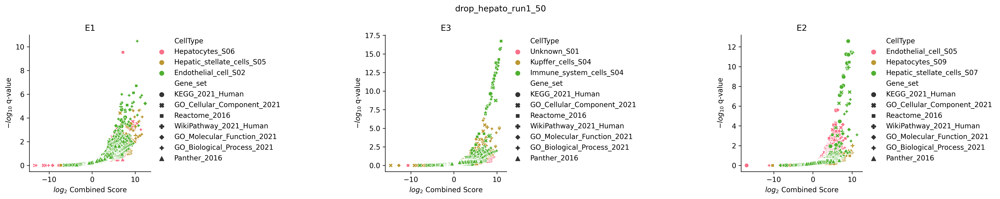

In [8]:
visualise.backend = "matplotlib"
fig = visualise.collection_scatterplot( collection = enrichr, 
                                        x = x, 
                                        y = y, 
                                        hue = hue, 
                                        style = style,
                                        figsize = (20, 4),
                                        xlabel = "$log_2$ Combined Score",
                                        ylabel = "$-log_{10}$ q-value",
                                    )
fig.suptitle( os.path.basename( directory ) )
sns.despine()
plt.tight_layout( w_pad = 10 )
plt.savefig( f"{outdir}/enrichr_summary.png" )

In [8]:
visualise.backend = "plotly"

fig = visualise.collection_scatterplot( collection = enrichr, 
                                        x = x, 
                                        y = y, 
                                        hue = hue, 
                                        style = style, 
                                        xlabel = "log_2 Combined Score",
                                        ylabel = "-log_10 Adjusted p-value",
                                    )
fig.write_html( f"{outdir}/enrichr_summary.plotly.html" )

fig.show()

----


## In dept analyses of the respective Ecotypes' cell types and states.

In this section we take a closer look at the cell types and states within the individual ecotypes based on the summary scatter plots above.

### E1
---

#### Hepatocytes state 06

In [29]:
hepatocytes_s06 = enrichr["E1"].query( "CellType == 'Hepatocytes_S06'" )
hepatocytes_s06 = hepatocytes_s06.sort_values( "Combined Score", ascending = False ) 
hepatocytes_s06[ "Genes" ] = hepatocytes_s06[ "Genes" ].apply( lambda x : x.replace(";", " ") )
hepatocytes_s06.head()

,CellType,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,log2_score,log10_qval
688,Hepatocytes_S06,GO_Biological_Process_2021,regulation of very-low-density lipoprotein par...,3/6,0.000003,0.000967,0,0,200.9596,2588.471,APOA2 NR1H4 APOC3,11.337884,3.014742
103,Hepatocytes_S06,GO_Cellular_Component_2021,spherical high-density lipoprotein particle (G...,3/8,0.000007,0.000308,0,0,120.5636,1429.687,APOA2 APOC3 HPR,10.481484,3.511530
711,Hepatocytes_S06,GO_Biological_Process_2021,glucuronate catabolic process (GO:0006064),2/5,0.000255,0.007168,0,0,132.6333,1097.447,DCXR AKR1A1,10.099936,2.144602
197,Hepatocytes_S06,Reactome_2016,Catabolism of glucuronate to xylulose-5-phosph...,2/5,0.000255,0.007055,0,0,132.6333,1097.447,DCXR AKR1A1,10.099936,2.151523
712,Hepatocytes_S06,GO_Biological_Process_2021,glucuronate catabolic process to xylulose 5-ph...,2/5,0.000255,0.007168,0,0,132.6333,1097.447,DCXR AKR1A1,10.099936,2.144602


Because the overview revealed many processed involved in lipid metabolism, we want to highlight these within the scatterplot. 

In [39]:
visualise.backend = "plotly"
hepato_scatter = visualise.StateScatterplot( hepatocytes_s06, x = x, y = y, hue = hue, style = style )

In [40]:
subsets = {
                "lipid associated" : [ "lipid", "lipoprotein", "triacyl", "lipase", "acylglycer", "triglycer", "chylomicron", "fat", "fatty ?-?_?acid", "L( |_|-)?DL", "H( |_|-)?DL", "V( |_|-)?LDL" ],
                "PPAR" : ["PPAR"],
                
                "oxydation / dehydrogenase" : ["oxidation", "dehydrogenase" ],
                "sugar associated" : ["ose", "glyco"],
                "amino acids" : ["valine", "leucine", "isoleucine", "methionine", "glutamine", "glutamate", "asparagine", "aspartate", "proline", "lysine", "tryptophane", "tyrosine", "arginine", "histidine", "serine", "glycine", "alanine", "threonine", "cysteine", "phenylalanine", "amino-?_?acid" ],
                "inflammation" : ["inflamma"],
            }

In [41]:
fig = hepato_scatter.highlight(     subsets = subsets, 
                                    ref_col = "Term",
                                    style = None,
                                    title = "Hepatocytes S06",
                                    hover_data = { "Combined Score" : "Combined Score", "Genes" : "Genes" },
                                    xlabel = "log_2 Norm. Enrichment Score",
                                    ylabel = "-log_10 q-value",    )
fig.show()

/home/noahkleinschmidt/.conda/envs/EcoTyper/lib/python3.10/site-packages/eco_helper/enrich/visualise.py:342: UserWarning:

This pattern has match groups. To actually get the groups, use str.extract.



In [42]:
fig.write_html( f"{outdir}/E1_hepatocytes_s06_highlights.html" )

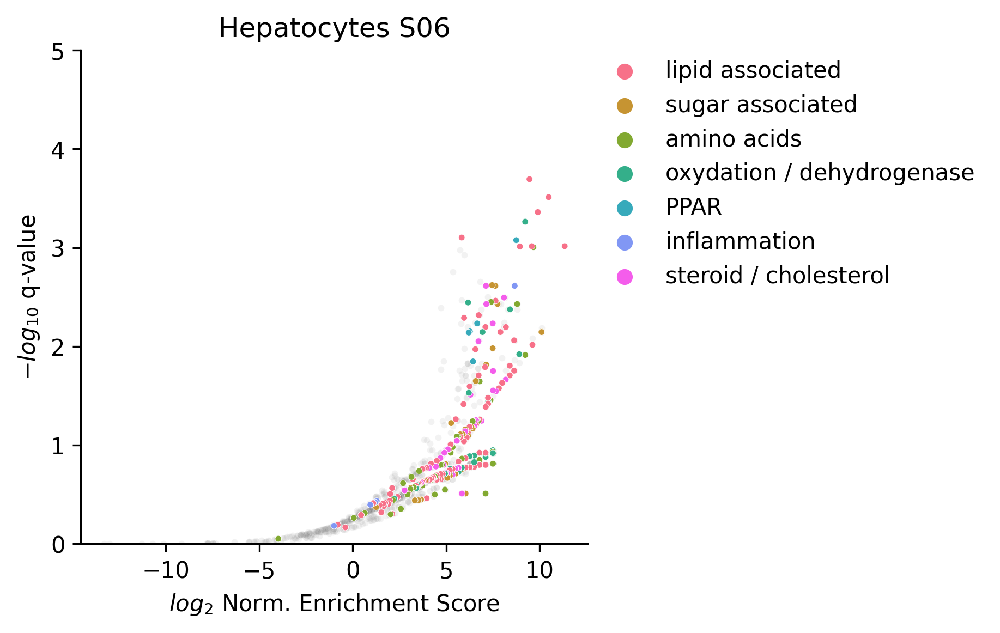

In [43]:
visualise.backend = "matplotlib"
fig = hepato_scatter.highlight(     subsets = subsets, 
                                    ref_col = "Term",
                                    style = None,
                                    title = "Hepatocytes S06",
                                    xlabel = "$log_2$ Norm. Enrichment Score",
                                    ylabel = "$-log_{10}$ q-value",
                                    s = 8,
                              )
plt.gca().set( ylim = (0,5) )
sns.despine()
plt.savefig( f"{outdir}/E1_hepatocytes_s06_highlights.png", bbox_inches = "tight" )

#### Hepatic stellate cells state 05

In [33]:
hepatic_s05 = enrichr["E1"].query( "CellType == 'Hepatic_stellate_cells_S05'" )
hepatic_s05 = hepatic_s05.sort_values( "Combined Score", ascending = False ) 
hepatic_s05[ "Genes" ] = hepatic_s05[ "Genes" ].apply( lambda x : x.replace(";" , " ") )
hepatic_s05.head()

,CellType,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,log2_score,log10_qval
463,Hepatic_stellate_cells_S05,GO_Biological_Process_2021,positive regulation of cholesterol esterificat...,3/9,9.471797e-07,0.000082,0,0,231.9535,3217.143,APOC1 AGTR1 APOE,11.651564,4.086910
469,Hepatic_stellate_cells_S05,GO_Biological_Process_2021,lipid transport across blood-brain barrier (GO...,2/5,5.152282e-05,0.002398,0,0,302.2879,2984.635,FABP5 CD36,11.543339,2.620188
458,Hepatic_stellate_cells_S05,GO_Biological_Process_2021,positive regulation of macrophage derived foam...,4/18,7.317179e-08,0.000022,0,0,135.6463,2228.730,AGTR1 LPL CD36 PF4,11.122006,4.654931
332,Hepatic_stellate_cells_S05,GO_Molecular_Function_2021,phosphatidylcholine-sterol O-acyltransferase a...,2/6,7.717120e-05,0.003241,0,0,226.7045,2146.775,APOC1 APOE,11.067955,2.489296
333,Hepatic_stellate_cells_S05,GO_Molecular_Function_2021,ATP-activated inward rectifier potassium chann...,2/6,7.717120e-05,0.003241,0,0,226.7045,2146.775,KCNJ8 ABCC9,11.067955,2.489296


In [34]:
visualise.backend = "plotly"
hepatic_scatter = visualise.StateScatterplot( hepatic_s05, x = x, y = y, hue = hue, style = style )

In [35]:
subsets = {
                "lipid associated (including PPAR)" : [ "lipid", "lipoprotein", "triacyl", "lipase", "acylglycer", "triglycer", "L( |_|-)?DL", "H( |_|-)?DL", "V( |_|-)?LDL", "chylomicron", "fat", "fatty ?-?_?acid", "PPAR" ],
                "cholesterol / steroid" : ["cholesterol", "steroid"],
                "GPCR related" : ["GPCR", "G ?-?_?protein"],
                "macrophage related" : ["macrophage"],
                "blood related" : ["blood", "vascular", "vaso" ],
            }

In [36]:
fig = hepatic_scatter.highlight(    subsets = subsets, 
                                    ref_col = "Term",
                                    style = None,
                                    title = "Hepatic stellate cells S05",
                                    hover_data = { "Combined Score" : "Combined Score", "Genes" : "Genes" },
                                    xlabel = "log_2 Norm. Enrichment Score",
                                    ylabel = "-log_10 q-value",
                              )
fig.show()

/home/noahkleinschmidt/.conda/envs/EcoTyper/lib/python3.10/site-packages/eco_helper/enrich/visualise.py:342: UserWarning:

This pattern has match groups. To actually get the groups, use str.extract.



In [37]:
fig.write_html( f"{outdir}/E1_hepatic_stellate_s05_highlights.html" )

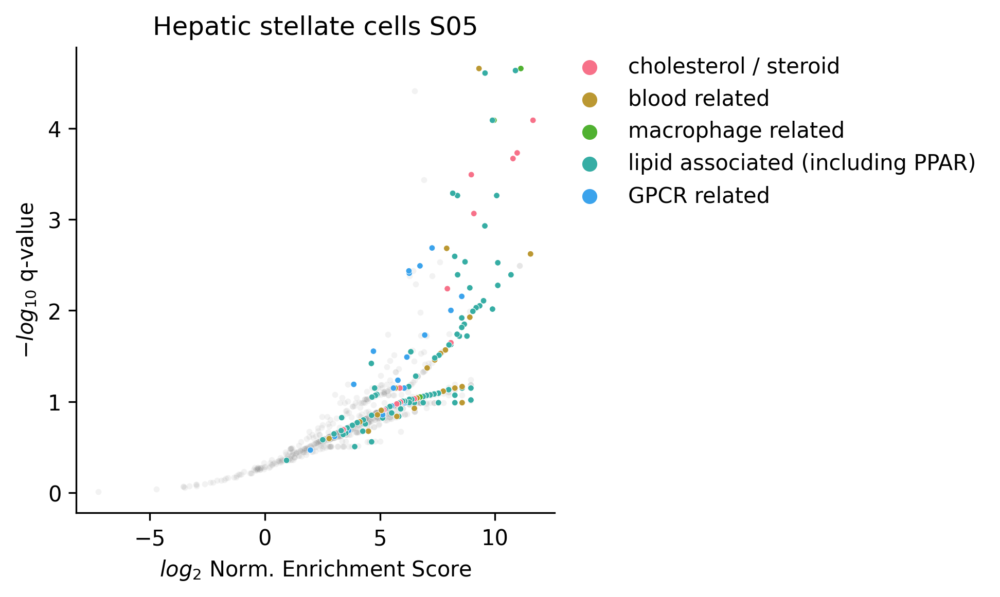

In [38]:
visualise.backend = "matplotlib"
fig = hepatic_scatter.highlight(    subsets = subsets, 
                                    ref_col = "Term",
                                    style = None,
                                    title = "Hepatic stellate cells S05",
                                    xlabel = "$log_2$ Norm. Enrichment Score",
                                    ylabel = "$-log_{10}$ q-value",
                                    s = 8,
                              )
sns.despine()
plt.savefig( f"{outdir}/E1_hepatic_stellate_s05_highlights.png", bbox_inches = "tight" )

#### Endothelial cells state 02

In [76]:
endo_s02 = enrichr["E1"].query( "CellType == 'Endothelial_cell_S02'" )
endo_s02 = endo_s02.sort_values( "Combined Score", ascending = False )
endo_s02[ "Genes" ] = endo_s02[ "Genes" ].apply( lambda x : x.replace(";" , " ") )

endo_s02.head()

,CellType,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,log2_score,log10_qval
1159,Endothelial_cell_S02,GO_Molecular_Function_2021,C3HC4-type RING finger domain binding (GO:0055...,4/6,3.035776e-08,0.000006,0,0,300.9394,5209.325,DNAJA1 HSPA8 HSPA1B HSPA1A,12.346881,5.216700
1362,Endothelial_cell_S02,GO_Biological_Process_2021,negative regulation of inclusion body assembly...,5/10,3.310596e-09,0.000001,0,0,151.5954,2960.073,DNAJB1 DNAJB6 DNAJA4 HSPA1B HSPA1A,11.531417,5.899169
1363,Endothelial_cell_S02,GO_Biological_Process_2021,regulation of inclusion body assembly (GO:0090...,5/11,6.036373e-09,0.000002,0,0,126.3232,2390.724,DNAJB1 DNAJB6 DNAJA4 HSPA1B HSPA1A,11.223232,5.735209
1379,Endothelial_cell_S02,GO_Biological_Process_2021,heat acclimation (GO:0010286),3/6,6.059532e-06,0.000440,0,0,149.3308,1794.042,HSPA6 HSPA1B HSPA1A,10.808998,3.356795
1378,Endothelial_cell_S02,GO_Biological_Process_2021,cellular heat acclimation (GO:0070370),3/6,6.059532e-06,0.000440,0,0,149.3308,1794.042,HSPA6 HSPA1B HSPA1A,10.808998,3.356795


In [77]:
visualise.backend = "plotly"
endo_scatter = visualise.StateScatterplot( endo_s02, x = x, y = y, hue = hue, style = style )

In [102]:
subsets = {
                "Inclusion body" : ["inclusion( |-|_)?body" ],
                "heat associated" : [ "thermo", "heat", "thermal", "heat( |-|_)shock", "HSF" ],
                "VEGF associated" : [ "VEGF", "vascular( |-|_)?endothelial( |-|_)?growth" ],                 
                "protein (mis-)folding related (including chaperones)" : [ "unfolded( |-|_)?protein", "chaperone", "incorrect protein", "protein( |-|_)?folding" ],
                "cytokine / chemokine related" : ["cytokine", "chemokine"],
                "DNA damage" : [ "DNA( |-|_)?damage", "break", ],
                "Interleukin" : ["interleukin", "IL-" ],
                "Interferon" : ["interferon", "IFN" ],
                "MAPK" : ["MAPK"],
                "Apoptosis" : ["apoptosis", "apopto"],
                "Stress response" : ["response to stress", "stress( |-|_)?response"],
                # "Adipocyte related" : ["adipo", "adipocyte"], # not very prevalent...

}

In [103]:
fig = endo_scatter.highlight(    subsets = subsets, 
                                    ref_col = "Term",
                                    style = None,
                                    title = "Endothelial cells S02",
                                    hover_data = { "Combined Score" : "Combined Score", "Genes" : "Genes" },
                                    xlabel = "log_2 Norm. Enrichment Score",
                                    ylabel = "-log_10 q-value",
                              )
fig.show()

/home/noahkleinschmidt/.conda/envs/EcoTyper/lib/python3.10/site-packages/eco_helper/enrich/visualise.py:342: UserWarning:

This pattern has match groups. To actually get the groups, use str.extract.



In [104]:
fig.write_html( f"{outdir}/E1_endothelial_s02_highlights.html" )

/home/noahkleinschmidt/.conda/envs/EcoTyper/lib/python3.10/site-packages/eco_helper/enrich/visualise.py:342: UserWarning:

This pattern has match groups. To actually get the groups, use str.extract.



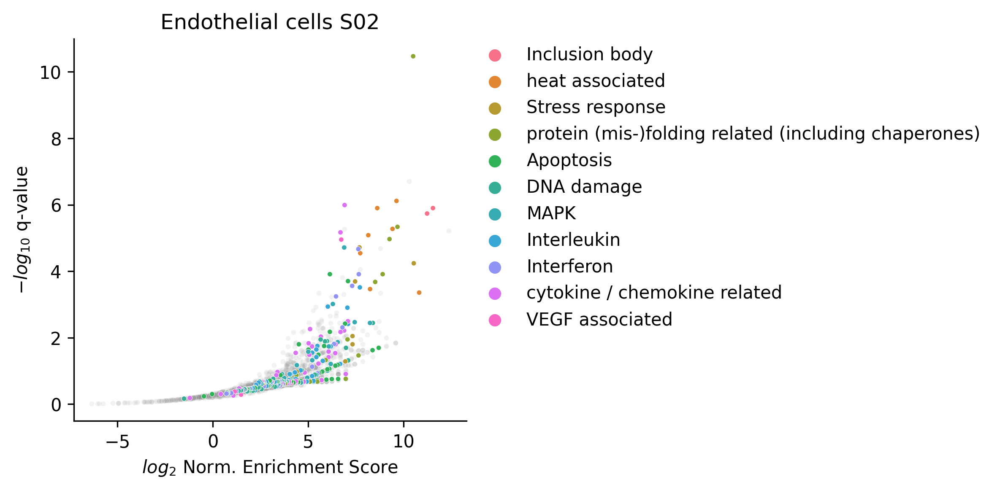

In [105]:
visualise.backend = "matplotlib"
fig = endo_scatter.highlight(    subsets = subsets, 
                                    ref_col = "Term",
                                    style = None,
                                    title = "Endothelial cells S02",
                                    xlabel = "$log_2$ Norm. Enrichment Score",
                                    ylabel = "$-log_{10}$ q-value",
                                    s = 8,
                              )
sns.despine()
plt.savefig( f"{outdir}/E1_endothelial_s02_highlights.png", bbox_inches = "tight" )

### E2
---

#### Endothelial cells (state 025)

In [108]:
enrichr["E2"].CellType.unique()

array(['Endothelial_cell_S05', 'Hepatocytes_S09',
       'Hepatic_stellate_cells_S07'], dtype=object)

In [113]:
endo_s05 = enrichr["E2"].query( "CellType == 'Endothelial_cell_S05'" )
endo_s05 = endo_s05.sort_values( "Combined Score", ascending = False )
endo_s05[ "Genes" ] = endo_s05[ "Genes" ].apply( lambda x : x.replace(";" , " ") )
endo_s05[ "Genes" ] = endo_s05[ "Genes" ].apply( lambda x : x[:80]+"..." if (len(x) > 80) else x )


endo_s05.head()

,CellType,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,log2_score,log10_qval
505,Endothelial_cell_S05,Reactome_2016,Gap junction degradation Homo sapiens R-HSA-19...,4/10,0.000037,0.001859,0,0,31.13922,317.3893,DAB2 MYO6 CLTA AP2M1,8.310110,2.730621
2118,Endothelial_cell_S05,GO_Biological_Process_2021,membrane invagination (GO:0010324),3/7,0.000309,0.016550,0,0,34.95179,282.5292,SNX3 CHMP2A FNBP1L,8.142256,1.781208
2128,Endothelial_cell_S05,GO_Biological_Process_2021,regulation of protein localization to early en...,3/8,0.000486,0.020510,0,0,27.96000,213.3125,ROCK2 RDX MSN,7.736825,1.688042
2129,Endothelial_cell_S05,GO_Biological_Process_2021,positive regulation of early endosome to late ...,3/8,0.000486,0.020510,0,0,27.96000,213.3125,DAB2 RDX MSN,7.736825,1.688042
2130,Endothelial_cell_S05,GO_Biological_Process_2021,positive regulation of protein localization to...,3/8,0.000486,0.020510,0,0,27.96000,213.3125,ROCK2 RDX MSN,7.736825,1.688042


In [115]:
visualise.backend = "plotly"
endo_scatter = visualise.StateScatterplot( endo_s05, x = x, y = y, hue = hue, style = style )

In [138]:
subsets = {        
    
                "heat associated" : [ "thermo", "heat", "thermal", "heat( |-|_)shock", "HSF" ],
                "VEGF associated" : [ "VEGF", "vascular( |-|_)?endothelial( |-|_)?growth" ],   

                "NADH / Oxphos" : [ "NADH", "oxidative ?-?phospho", "respiratory ?-?chain", "oxphos", "electron ?-?_?transport", "electron ?-?_?transport ?-?_?chain" ],
                "Gap junctions" : ["gap ?-?junction"],

                "Membrane associated" : ["membrane"],
                
                "Rap1" : ["rap1"],

                "Cell surface" : ["cell ?-?surface", "cell ?-?periphery", "cell ?-?membrane", "plasma ?-?membrane", "integrin", "adhesion", "cell-cell", "cadherin" ],

                # "protein (mis-)folding related (including chaperones)" : [ "unfolded( |-|_)?protein", "chaperone", "incorrect protein", "protein( |-|_)?folding" ],
                # "cytokine / chemokine related" : ["cytokine", "chemokine"],
                # "DNA damage" : [ "DNA( |-|_)?damage", "break", ],
                # "Interleukin" : ["interleukin", "IL-" ],
                # "Interferon" : ["interferon", "IFN" ],
                "MAPK" : ["MAPK", "ERK"],

                "Signaling" : ["signaling", "signalling"],

                # "DVL associated" : ["DVL", "PCP/CE", ], #only two entries...
                "Wnt signaling" : ["wnt( |-)"],
        
                "Apoptosis" : ["apoptosis", "apopto"],
                "PI3K / mTOR (and feeding pathways)" : ["PI3K", "akt", "mtor", "IGF1R", ],
                # "Stress response" : ["response to stress", "stress( |-|_)?response"],
                # "Adipocyte related" : ["adipo", "adipocyte"], # not very prevalent...

}

In [141]:
fig = endo_scatter.highlight(    subsets = subsets, 
                                    ref_col = "Term",
                                    style = None,
                                    title = "Endothelial cells S05",
                                    hover_data = { "Combined Score" : "Combined Score", "Genes" : "Genes" },
                                    xlabel = "log_2 Norm. Enrichment Score",
                                    ylabel = "-log_10 q-value",
                                    template = "ggplot2",
                                    color_discrete_sequence=list( sns.color_palette("hls", len( subsets.keys() ) ).as_hex() )
                              )
fig.show()

/home/noahkleinschmidt/.conda/envs/EcoTyper/lib/python3.10/site-packages/eco_helper/enrich/visualise.py:342: UserWarning:

This pattern has match groups. To actually get the groups, use str.extract.



In [142]:
fig.write_html( f"{outdir}/E2_endothelial_s02_highlights.html" )

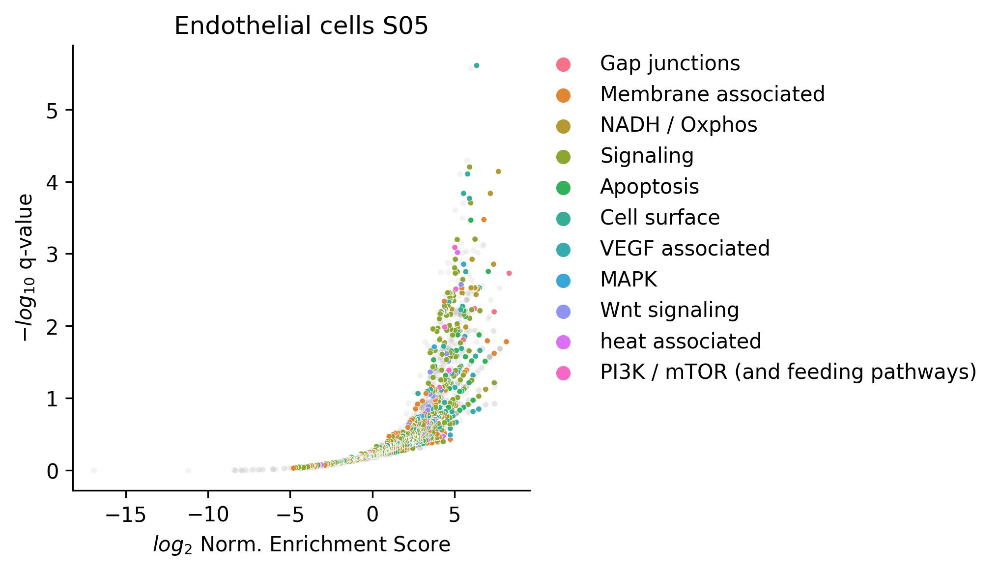

In [143]:
visualise.backend = "matplotlib"
fig = endo_scatter.highlight(    subsets = subsets, 
                                    ref_col = "Term",
                                    style = None,
                                    title = "Endothelial cells S05",
                                    xlabel = "$log_2$ Norm. Enrichment Score",
                                    ylabel = "$-log_{10}$ q-value",
                                    s = 8,
                              )
sns.despine()
plt.savefig( f"{outdir}/E2_endothelial_s05_highlights.png", bbox_inches = "tight" )

#### Hepatocytes (state 09)

In [10]:
hepatocytes_s09 = enrichr["E2"].query( "CellType == 'Hepatocytes_S09'" )
hepatocytes_s09 = hepatocytes_s09.sort_values( "Combined Score", ascending = False ) 
hepatocytes_s09[ "Genes" ] = hepatocytes_s09[ "Genes" ].apply( lambda x : x.replace(";", " ") )
hepatocytes_s09.head()

,CellType,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,log2_score,log10_qval
468,Hepatocytes_S09,WikiPathway_2021_Human,Cellular Proteostasis WP4918,2/6,0.000217,0.010103,0,0,132.7933,1120.0290,PFDN2 PFDN4,10.129320,1.995552
695,Hepatocytes_S09,GO_Biological_Process_2021,succinate transmembrane transport (GO:0071422),2/6,0.000217,0.052643,0,0,132.7933,1120.0290,SLC13A2 SLC25A30,10.129320,1.278662
697,Hepatocytes_S09,GO_Biological_Process_2021,coronary vasculature development (GO:0060976),2/7,0.000303,0.052643,0,0,106.2293,860.5007,MESP1 GPC3,9.749033,1.278662
696,Hepatocytes_S09,GO_Biological_Process_2021,succinate transport (GO:0015744),2/7,0.000303,0.052643,0,0,106.2293,860.5007,SLC13A2 SLC25A30,9.749033,1.278662
560,Hepatocytes_S09,GO_Molecular_Function_2021,succinate transmembrane transporter activity (...,2/7,0.000303,0.034676,0,0,106.2293,860.5007,SLC13A2 SLC25A30,9.749033,1.459973


In [11]:
visualise.backend = "plotly"
hepato_scatter = visualise.StateScatterplot( hepatocytes_s09, x = x, y = y, hue = hue, style = style )

In [20]:
subsets = {
                    "lipid associated (including PPAR and adipo-terms)" : [ "lipid", "lipoprotein", "triacyl", "lipase", "acylglycer", "triglycer", "L( |_|-)?DL", "H( |_|-)?DL", "V( |_|-)?LDL", "chylomicron", "fat", "fatty ?-?_?acid", "PPAR", "adip" ],
                    "succinate related" : ["succinate", "succinyl"],
                    "Apoptosis (including P53)" : ["apopto", "PUMA", "p53"],
                    "vitamins" : ["vitamin"], # low q-val...
                    "mitochondria" : ["mitochondria"],
                    "cell structures" : ["actin", "fibr", "cyto ?-?skelet", "envel", "tubulin"],
                    "(transmembrane) transport" : ["transmembrane", "transmembrane ?-?transport", "transporter", "channel"],
                    "cell cycle" : ["cyclin", "CDK", "cell ?-?cycle"],
                    
}  

In [23]:
fig = hepato_scatter.highlight(    subsets = subsets, 
                                    ref_col = "Term",
                                    style = None,
                                    title = "Hepatocytes S09",
                                    hover_data = { "Combined Score" : "Combined Score", "Genes" : "Genes" },
                                    xlabel = "log_2 Norm. Enrichment Score",
                                    ylabel = "-log_10 q-value",
                                    template = "ggplot2",
                                    color_discrete_sequence=list( sns.color_palette("hls", len( subsets.keys() )+1 ).as_hex() )
                              )
fig.show()

In [24]:
fig.write_html( f"{outdir}/E2_hepatocytes_s09_highlights.html" )

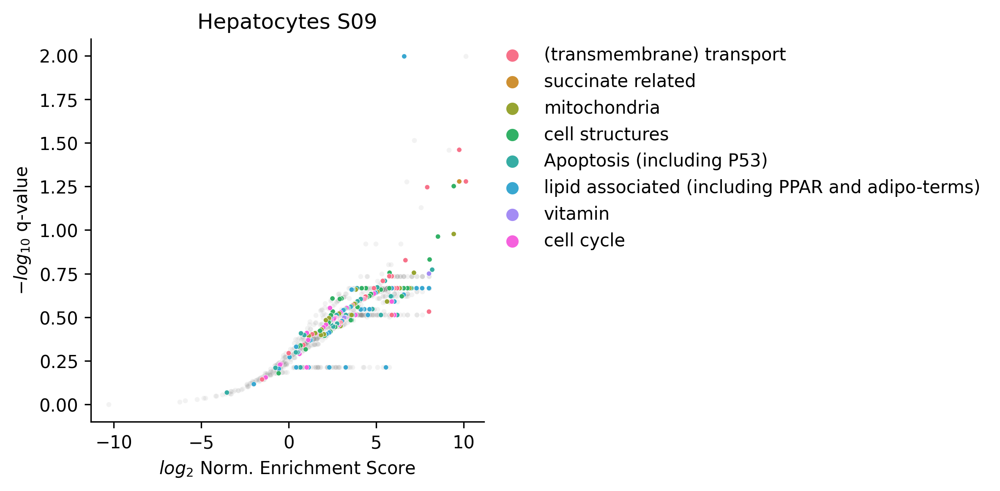

In [26]:
visualise.backend = "matplotlib"
fig = hepato_scatter.highlight(    subsets = subsets, 
                                    ref_col = "Term",
                                    style = None,
                                    title = "Hepatocytes S09",
                                    xlabel = "$log_2$ Norm. Enrichment Score",
                                    ylabel = "$-log_{10}$ q-value",
                                    s = 8,
                              )
sns.despine()
plt.savefig( f"{outdir}/E2_hepatocytes_s09_highlights.png", bbox_inches = "tight" )

#### Hepatic Stellate (state 07)

In [27]:
hepatic_s07 = enrichr["E2"].query( "CellType == 'Hepatic_stellate_cells_S07'" )
hepatic_s07 = hepatic_s07.sort_values( "Combined Score", ascending = False ) 
hepatic_s07[ "Genes" ] = hepatic_s07[ "Genes" ].apply( lambda x : x.replace(";", " ") )
hepatic_s07.head()

,CellType,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,log2_score,log10_qval
1411,Hepatic_stellate_cells_S07,GO_Biological_Process_2021,positive regulation of intrinsic apoptotic sig...,3/5,4.340661e-06,8.024022e-04,0,0,198.45000,2450.3580,EIF5A UBB RPS7,11.258777,3.095608
1181,Hepatic_stellate_cells_S07,GO_Molecular_Function_2021,oxidoreduction-driven active transmembrane tra...,12/58,1.708730e-14,3.827556e-12,0,0,36.63460,1161.3330,COX8A NDUFA13 NDUFA5 NDUFB4 NDUFB3 NDUFB2 NDUF...,10.181566,11.417078
1405,Hepatic_stellate_cells_S07,GO_Biological_Process_2021,aerobic electron transport chain (GO:0019646),13/70,5.972595e-15,4.699637e-12,0,0,32.23935,1055.8900,COX8A COX7B NDUFA13 NDUFA5 NDUFB4 NDUFB3 NDUFB...,10.044244,11.327936
1406,Hepatic_stellate_cells_S07,GO_Biological_Process_2021,mitochondrial ATP synthesis coupled electron t...,13/71,7.263736e-15,4.699637e-12,0,0,31.68190,1031.4320,COX8A COX7B NDUFA13 NDUFA5 NDUFB4 NDUFB3 NDUFB...,10.010433,11.327936
309,Hepatic_stellate_cells_S07,Reactome_2016,Respiratory electron transport Homo sapiens R-...,14/88,5.077775e-15,3.280242e-12,0,0,26.91250,885.7955,COX8A COX7B NDUFA13 NDUFA5 NDUFB4 NDUFB3 NDUFB...,9.790830,11.484094


In [48]:
visualise.backend = "plotly"
hepatic_scatter = visualise.StateScatterplot( hepatic_s07, x = x, y = y, hue = hue, style = style )

In [49]:
subsets = {     

                     "Oxphos / TCA" : [ "NADH", "oxidative ?-?phospho", "respiratory ?-?chain", "oxphos", 
                                       "electron ?-?_?transport", "electron ?-?_?transport ?-?_?chain", 
                                       "TCA", "citric ?-?acid ?-?cycle", "krebs ?-?cycle", "cytochrome",
                                       "mitochondrial ?-?(inner)? ?-?membrane", "proton transmembrane", "Complex-? ?(I|II|III|IV|V)",
                                       "oxidoreduction",
                                       
                                    ],
                     "heat associated" : [ "thermo", "heat", "thermal", "heat( |-|_)shock", "HSF" ],
                     "Apoptosis (including P53)" : ["apopto", "p53"],
                     "iron" : ["iron"],
                     "neurodegenerative terms" : [
                                                   "Prion disease",
                                                   "Huntington disease",
                                                   "Alzheimer disease",
                                                   "Amyotrophic lateral sclerosis",
                                                   "Parkinson disease",
                                                   "neurodegener",
                                                ],                 
}  

In [50]:
fig = hepatic_scatter.highlight(    subsets = subsets, 
                                    ref_col = "Term",
                                    style = None,
                                    title = "Hepatic stellate cells S07",
                                    hover_data = { "Combined Score" : "Combined Score", "Genes" : "Genes" },
                                    xlabel = "log_2 Norm. Enrichment Score",
                                    ylabel = "-log_10 q-value",
                                    template = "ggplot2",
                                    color_discrete_sequence=list( sns.color_palette("hls", len( subsets.keys() )+1 ).as_hex() )
                              )
fig.show()

/home/noahkleinschmidt/.conda/envs/EcoTyper/lib/python3.10/site-packages/eco_helper/enrich/visualise.py:342: UserWarning:

This pattern has match groups. To actually get the groups, use str.extract.



In [51]:
fig.write_html( f"{outdir}/E2_hepatic_stellate_s07_highlights.html" )

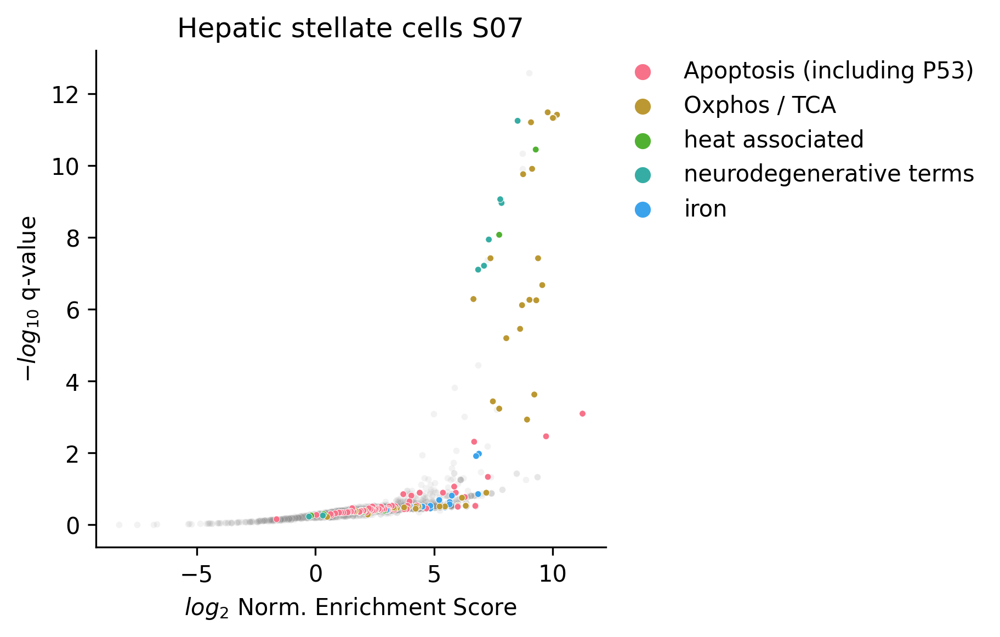

In [52]:
visualise.backend = "matplotlib"
fig = hepatic_scatter.highlight(    subsets = subsets, 
                                    ref_col = "Term",
                                    style = None,
                                    title = "Hepatic stellate cells S07",
                                    xlabel = "$log_2$ Norm. Enrichment Score",
                                    ylabel = "$-log_{10}$ q-value",
                                    s = 8,
                              )
sns.despine()
plt.savefig( f"{outdir}/E2_hepatic_stellate_s07_highlights.png", bbox_inches = "tight" )

### E3
-------

#### Unknown (state 01)


In [53]:
unknown_s01 = enrichr["E3"].query( "CellType == 'Unknown_S01'" )
unknown_s01 = unknown_s01.sort_values( "Combined Score", ascending = False ) 
unknown_s01[ "Genes" ] = unknown_s01[ "Genes" ].apply( lambda x : x.replace(";", " ") )
unknown_s01.head()

,CellType,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,log2_score,log10_qval
370,Unknown_S01,GO_Biological_Process_2021,positive regulation of epidermal growth factor...,2/11,0.000417,0.074896,0,0,82.03704,638.5058,NCF1 FBXW7,9.318556,1.125541
371,Unknown_S01,GO_Biological_Process_2021,mature B cell differentiation involved in immu...,2/13,0.000589,0.074896,0,0,67.11448,499.1545,POU2AF1 PTK2B,8.963343,1.125541
372,Unknown_S01,GO_Biological_Process_2021,endoderm development (GO:0007492),2/15,0.000790,0.074896,0,0,56.78348,405.6442,DUSP5 MIXL1,8.664071,1.125541
86,Unknown_S01,Reactome_2016,FBXW7 Mutants and NOTCH1 in Cancer Homo sapien...,1/5,0.013923,0.252162,0,0,90.63636,387.3986,FBXW7,8.597675,0.598320
398,Unknown_S01,GO_Biological_Process_2021,glucosylceramide metabolic process (GO:0006678),1/5,0.013923,0.145951,0,0,90.63636,387.3986,FA2H,8.597675,0.835794


In [72]:
visualise.backend = "plotly"
unknown_scatter = visualise.StateScatterplot( unknown_s01, x = x, y = y, hue = hue, style = style )

In [70]:
subsets = {     
     "B cell related" : ["B-? ?cell"],
     "T cell related" : ["T-? ?cell"],
    "lymphocytes general" : ["lymphocyte"],
    "growth factors" : ["growth factor"],
    "DNA damage" : [ "DNA( |-|_)?damage", "break", ],
    "Interleukin" : ["interleukin", "IL-" ],
    "Interferon" : ["interferon", "IFN" ],

    "MAPK" : ["mapk"],
    "GPCR" : ["gpcr"],
    # "NFKB" : ["nf-?k-?b", "kappa-beta"], # only two entries...
    "immune response" : ["immune response"],
    "NJK" : ["NJK"],
    "transmembrane transport" : ["transmembrane", "transmembrane transport", "transporter", "channel" ],
    
}  

In [73]:
fig = unknown_scatter.highlight(    subsets = subsets, 
                                    ref_col = "Term",
                                    style = None,
                                    title = "Unknown S01",
                                    hover_data = { "Combined Score" : "Combined Score", "Genes" : "Genes" },
                                    xlabel = "log_2 Norm. Enrichment Score",
                                    ylabel = "-log_10 q-value",
                                    template = "ggplot2",
                                    color_discrete_sequence=list( sns.color_palette("hls", len( subsets.keys() )+1 ).as_hex() )
                              )
fig.show()

/home/noahkleinschmidt/.conda/envs/EcoTyper/lib/python3.10/site-packages/eco_helper/enrich/visualise.py:342: UserWarning:

This pattern has match groups. To actually get the groups, use str.extract.



In [67]:
fig.write_html( f"{outdir}/E3_unknown_s01_highlights.html" )

/home/noahkleinschmidt/.conda/envs/EcoTyper/lib/python3.10/site-packages/eco_helper/enrich/visualise.py:342: UserWarning:

This pattern has match groups. To actually get the groups, use str.extract.



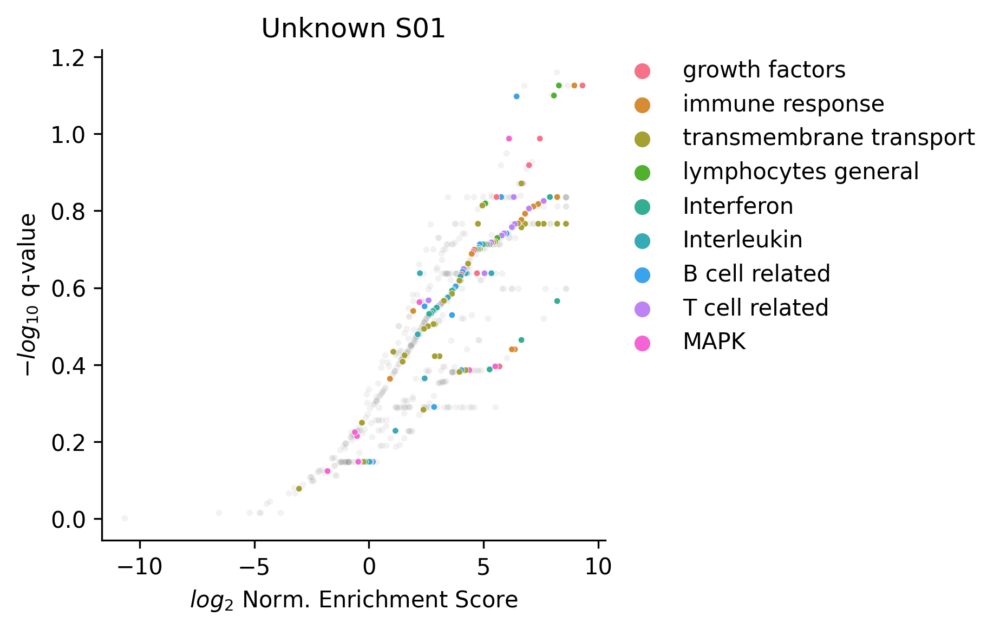

In [69]:
visualise.backend = "matplotlib"
fig = unknown_scatter.highlight(    subsets = subsets, 
                                    ref_col = "Term",
                                    style = None,
                                    title = "Unknown S01",
                                    xlabel = "$log_2$ Norm. Enrichment Score",
                                    ylabel = "$-log_{10}$ q-value",
                                    s = 8,
                              )
sns.despine()
plt.savefig( f"{outdir}/E3_unknown_s01_highlights.png", bbox_inches = "tight" )

#### Kuppfer cells (state 04)

In [75]:
kupffer_s04 = enrichr["E3"].query( "CellType == 'Kupffer_cells_S04'" )
kupffer_s04 = kupffer_s04.sort_values( "Combined Score", ascending = False ) 
kupffer_s04[ "Genes" ] = kupffer_s04[ "Genes" ].apply( lambda x : x.replace(";", " ") )
kupffer_s04.head()

,CellType,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,log2_score,log10_qval
976,Kupffer_cells_S04,GO_Molecular_Function_2021,complement receptor activity (GO:0004875),5/11,3.323734e-08,0.000009,0,0,88.72312,1527.7760,CR1 C5AR2 FPR1 FPR2 CMKLR1,10.577217,5.058418
1242,Kupffer_cells_S04,GO_Biological_Process_2021,complement receptor mediated signaling pathway...,5/11,3.323734e-08,0.000012,0,0,88.72312,1527.7760,CR1 C5AR2 FPR1 FPR2 CMKLR1,10.577217,4.928228
1244,Kupffer_cells_S04,GO_Biological_Process_2021,negative regulation of interleukin-12 producti...,5/14,1.407122e-07,0.000040,0,0,59.13978,933.0217,TLR8 LILRB1 THBS1 LILRA5 CMKLR1,9.865767,4.400650
1254,Kupffer_cells_S04,GO_Biological_Process_2021,"complement activation, alternative pathway (GO...",3/7,2.917325e-05,0.003091,0,0,79.00931,825.0356,CFD CR1 CFP,9.688313,2.509965
978,Kupffer_cells_S04,GO_Molecular_Function_2021,serine-type exopeptidase activity (GO:0070008),3/7,2.917325e-05,0.002558,0,0,79.00931,825.0356,ACE TPP1 CPVL,9.688313,2.592181


In [76]:
visualise.backend = "plotly"
kupffer_scatter = visualise.StateScatterplot( kupffer_s04, x = x, y = y, hue = hue, style = style )

In [89]:
subsets = {     
     "B cell related" : ["B-? ?cell"],
     "T cell related" : ["T-? ?cell"],
    # "lymphocytes general" : ["lymphocyte"],
    # "growth factors" : ["growth factor"],
    # "DNA damage" : [ "DNA( |-|_)?damage", "break", ],
    "Interleukin" : ["interleukin", "IL-" ],
    "Interferon" : ["interferon", "IFN" ],
    "complement system" : ["complement"],
    "sugar metabolism" : ["sugar", "ose", "glyco"],
    
    "lysosome / lysis related" : ["lysis", "lyso", "lytic", "granul" ],

    # "MAPK" : ["mapk"],
    # "GPCR" : ["gpcr"],
    # # "NFKB" : ["nf-?k-?b", "kappa-beta"], # only two entries...
    "immunity / inflammation" : ["immune response", "immune", "immunity", "inflamma", ],
    # "NJK" : ["NJK"],
    # "transmembrane transport" : ["transmembrane", "transmembrane transport", "transporter", "channel" ],
    
}  

In [90]:
fig = kupffer_scatter.highlight(    subsets = subsets, 
                                    ref_col = "Term",
                                    style = None,
                                    title = "Kupffer cells S04",
                                    hover_data = { "Combined Score" : "Combined Score", "Genes" : "Genes" },
                                    xlabel = "log_2 Norm. Enrichment Score",
                                    ylabel = "-log_10 q-value",
                                    template = "ggplot2",
                                    color_discrete_sequence=list( sns.color_palette("hls", len( subsets.keys() )+1 ).as_hex() )
                              )
fig.show()

In [91]:
fig.write_html( f"{outdir}/E3_kupffer_s04_highlights.html" )

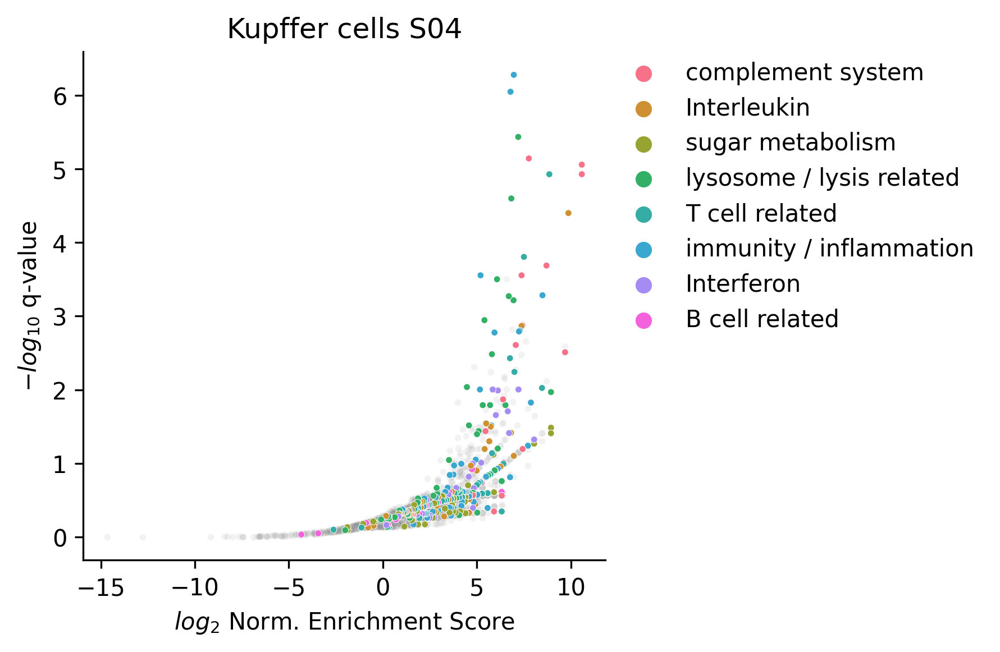

In [92]:
visualise.backend = "matplotlib"
fig = kupffer_scatter.highlight(    subsets = subsets, 
                                    ref_col = "Term",
                                    style = None,
                                    title = "Kupffer cells S04",
                                    xlabel = "$log_2$ Norm. Enrichment Score",
                                    ylabel = "$-log_{10}$ q-value",
                                    s = 8,
                              )
sns.despine()
plt.savefig( f"{outdir}/E3_kupffer_s04_highlights.png", bbox_inches = "tight" )

#### Immune cells (state 04)

In [10]:
immune_s04 = enrichr["E3"].query( "CellType == 'Immune_system_cells_S04'" )
immune_s04 = immune_s04.sort_values( "Combined Score", ascending = False ) 
immune_s04[ "Genes" ] = immune_s04[ "Genes" ].apply( lambda x : x.replace(";", " ") )
immune_s04.head()

,CellType,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,log2_score,log10_qval
233,Immune_system_cells_S04,Reactome_2016,Eukaryotic Translation Elongation Homo sapiens...,16/89,3.870139e-20,1.915719e-17,0,0,45.23973,2022.144,RPL4 RPL21 RPS6 RPL13A RPL7 EEF1A1 RPS17 RPL18...,10.981670,16.717668
234,Immune_system_cells_S04,Reactome_2016,Peptide chain elongation Homo sapiens R-HSA-15...,15/84,6.800779e-19,1.683193e-16,0,0,44.41730,1858.068,RPL4 RPL21 RPS6 RPL13A RPL7 EEF1A1 RPS17 RPL18...,10.859588,15.773866
728,Immune_system_cells_S04,WikiPathway_2021_Human,Cytoplasmic Ribosomal Proteins WP477,15/89,1.712839e-18,2.260947e-16,0,0,41.40568,1693.839,RPL4 RPL21 RPS6 RPL13A RPL7 RPS6KA3 RPS17 RPL1...,10.726081,15.645710
235,Immune_system_cells_S04,Reactome_2016,Viral mRNA Translation Homo sapiens R-HSA-192823,14/84,2.953525e-17,4.873317e-15,0,0,40.44490,1539.371,RPL4 RPL21 RPS6 RPL13A RPL7 RPS17 RPL18A RPL36...,10.588125,14.312175
236,Immune_system_cells_S04,Reactome_2016,Selenocysteine synthesis Homo sapiens R-HSA-24...,14/87,4.964601e-17,4.914955e-15,0,0,38.77691,1455.748,RPL4 RPL21 RPS6 RPL13A RPL7 RPS17 RPL18A RPL36...,10.507545,14.308480


In [11]:
visualise.backend = "plotly"
immune_scatter = visualise.StateScatterplot( immune_s04, x = x, y = y, hue = hue, style = style )

In [24]:
subsets = {   


    "translation" : ["translation", "rRNA", "ribosom", "peptide chain", "elongation", "initiation", "termination"], 
    "RNA metabolism" : ["m?RNA", "transcription", "NMD", "nonsense ?-?mediated"],

    "Interleukin" : ["interleukin", "IL-" ],
    "Interferon" : ["interferon", "IFN" ],

    "immunity (including B/T cells + inflamm.)" : ["immune response", "immune", "immuno", "immunity", "inflamma", "B-? ?cell", "T-? ?cell", "lymphocyte", "lymph(atic|oid) cell" ],

}  

In [25]:
fig = immune_scatter.highlight(    subsets = subsets, 
                                    ref_col = "Term",
                                    style = None,
                                    title = "Immune cells S04",
                                    hover_data = { "Combined Score" : "Combined Score", "Genes" : "Genes" },
                                    xlabel = "log_2 Norm. Enrichment Score",
                                    ylabel = "-log_10 q-value",
                                    template = "ggplot2",
                                    color_discrete_sequence=list( sns.color_palette("hls", len( subsets.keys() )+1 ).as_hex() )
                              )
fig.show()

/home/noahkleinschmidt/.conda/envs/EcoTyper/lib/python3.10/site-packages/eco_helper/enrich/visualise.py:342: UserWarning:

This pattern has match groups. To actually get the groups, use str.extract.



In [26]:
fig.write_html( f"{outdir}/E3_immune_s04_highlights.html" )

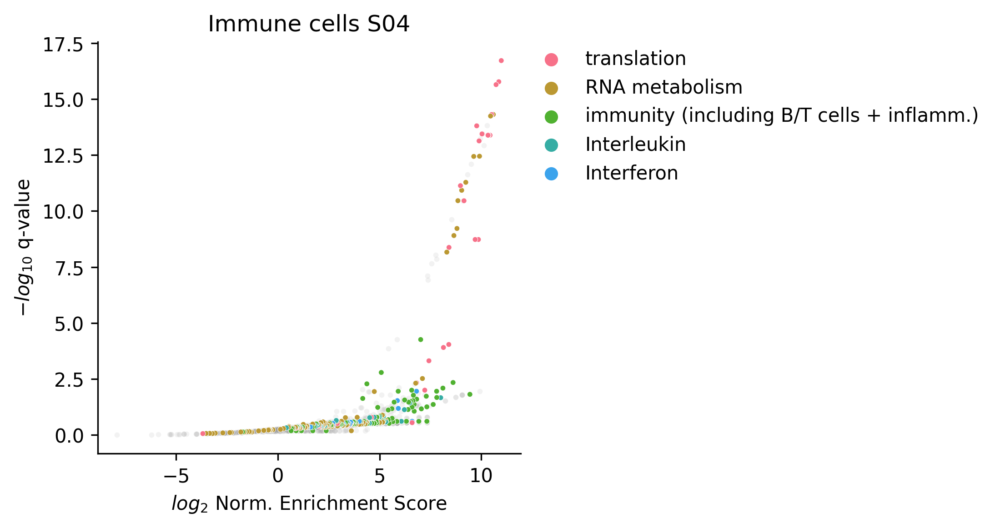

In [28]:
visualise.backend = "matplotlib"
fig = immune_scatter.highlight(    subsets = subsets, 
                                    ref_col = "Term",
                                    style = None,
                                    title = "Immune cells S04",
                                    xlabel = "$log_2$ Norm. Enrichment Score",
                                    ylabel = "$-log_{10}$ q-value",
                                    s = 8,
                              )
sns.despine()
plt.savefig( f"{outdir}/E3_immune_s04_highlights.png", bbox_inches = "tight" )

--- 

In [129]:
list( sns.color_palette("hls", 20).as_hex() )


['#db5f57',
 '#db8657',
 '#dbae57',
 '#dbd657',
 '#b9db57',
 '#91db57',
 '#69db57',
 '#57db6c',
 '#57db94',
 '#57dbbb',
 '#57d3db',
 '#57acdb',
 '#5784db',
 '#575cdb',
 '#7957db',
 '#a157db',
 '#c957db',
 '#db57c6',
 '#db579e',
 '#db5777']

In [125]:
px.colors.qualitative.Light24

['#FD3216',
 '#00FE35',
 '#6A76FC',
 '#FED4C4',
 '#FE00CE',
 '#0DF9FF',
 '#F6F926',
 '#FF9616',
 '#479B55',
 '#EEA6FB',
 '#DC587D',
 '#D626FF',
 '#6E899C',
 '#00B5F7',
 '#B68E00',
 '#C9FBE5',
 '#FF0092',
 '#22FFA7',
 '#E3EE9E',
 '#86CE00',
 '#BC7196',
 '#7E7DCD',
 '#FC6955',
 '#E48F72']